<center> <h1> Earth 468: Lab09- Greenland Uplift

In [1]:
using DataFrames
using StatsBase
using Gadfly

<h3> Define linear least squares function 

In [15]:
function LinearUpliftFit(gps)
   """Linear least squares solution to a two column time series
      System : u = m1 + m2*t"""
    
    G = ones(length(gps[:,1]),2)
    G[:,1] = gps[:,1]
    
    m = inv(G'*G)*G'*gps[:,2]
    
    return m
end


function SeasonalModelFit(gps)
    """Linear least squares solution to a two column time series 
       System : u = m1 + m2*t + m3*sin(t*2*pi) + m4*cos(t*2*pi)"""
   
    G = ones(length(gps[:,1]), 4)
    G[:,2] = gps[:,1]
    G[:,3] = sin(gps[:,1].*pi.*2)
    G[:,4] = cos(gps[:,1].*pi.*2)
    
    m = inv(G'*G)*G'*gps[:,2]
    
    return m
end

SeasonalModelFit (generic function with 1 method)

<h3> Import data

In [3]:
# greenland ice mass NASA data
icemass = readtable("Greenland_IceMass_NASA.csv")

# uplift data from KELY station
kely = readtable("KELY_up.csv")

# uplift data from KULU station
kulu = readtable("KULU_up.csv")

# uplift data from QAQ1 station
qaq1 = readtable("QAQ1_up.csv");

<h3> (a)

In [38]:
m_kely = LinearUpliftFit(kely)
m_kulu = LinearUpliftFit(kulu)
m_qaq1 = LinearUpliftFit(qaq1);

In [100]:
# Plot best fit line
x1 = linspace(minimum(qaq1[:,1])-1,maximum(qaq1[:,1])+1,100)
x2 = linspace(minimum(kely[:,1])-1,maximum(kely[:,1])+1,100)
x3 = linspace(minimum(kulu[:,1])-1,maximum(kulu[:,1])+1,100);

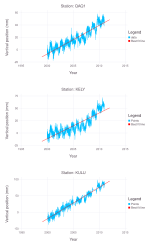

In [104]:
set_default_plot_size(15cm, 25cm)
# qaq1
p01 = plot(layer(x = x1 + 2000, y = m_qaq1[1].*x1 + m_qaq1[2], Theme(default_color=colorant"red") , Geom.line),
     layer(x = qaq1[:,1] + 2000, y = qaq1[:,2], Geom.line),
     Guide.xlabel("Year"), Guide.ylabel("Vertical position (mm)"),
     Guide.title("Station: QAQ1"),
     Guide.manual_color_key("Legend", ["data", "Best fit line"], ["deepskyblue", "red"]))

# kely
p02 = plot(layer(x = x2 + 2000, y = m_kely[1].*x2 + m_kely[2], Theme(default_color=colorant"red") , Geom.line),
     layer(x = kely[:,1] + 2000, y = kely[:,2], Geom.line),
     Guide.xlabel("Year"), Guide.ylabel("Vertical position (mm)"),
     Guide.title("Station: KELY"),
     Guide.manual_color_key("Legend", ["Points", "Best fit line"], ["deepskyblue", "red"]))

# kulu
p03 = plot(layer(x = x3 + 2000, y = m_kulu[1].*x3 + m_kulu[2], Theme(default_color=colorant"red") , Geom.line),
     layer(x = kulu[:,1] + 2000, y = kulu[:,2], Geom.line),
     Guide.xlabel("Year"), Guide.ylabel("Vertical position (mm)"),
     Guide.title("Station: KULU"),
     Guide.manual_color_key("Legend", ["Points", "Best fit line"], ["deepskyblue", "red"]))

vstack(p01, p02, p03)

Uplift rates:
* KELY station: 5.2 mm/yr
* KULU station: 9.5 mm/yr
* QAQ1 station: 4.6 mm/yr

<h3> (b)

In [17]:
# Residuals for the 3 stations
res_kely = kely[:,2] - (m_kely[1].*kely[:,1] + m_kely[2])
res_kulu = kulu[:,2] - (m_kulu[1].*kulu[:,1] + m_kulu[2])
res_qaq1 = qaq1[:,2] - (m_qaq1[1].*qaq1[:,1] + m_qaq1[2]);

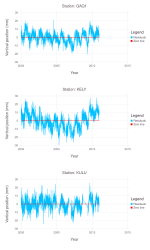

In [105]:
set_default_plot_size(15cm, 25cm)

# qaq1
p1 = plot(layer(x = qaq1[:,1] + 2000, y = 0.*qaq1[:,1], Theme(default_color=colorant"red"), Geom.line),
     layer(x = qaq1[:,1] + 2000, y = res_qaq1, Geom.line),
     Guide.xlabel("Year"), Guide.ylabel("Vertical position (mm)"),
     Guide.title("Station: QAQ1"),
     Guide.manual_color_key("Legend", ["Residuals", "Zero line"], ["deepskyblue", "red"]))

# kely
p2 = plot(layer(x = kely[:,1] + 2000, y = 0.*kely[:,1], Theme(default_color=colorant"red"), Geom.line),
     layer(x = kely[:,1] + 2000, y = res_kely, Geom.line),
     Guide.xlabel("Year"), Guide.ylabel("Vertical position (mm)"),
     Guide.title("Station: KELY"),
     Guide.manual_color_key("Legend", ["Residuals", "Zero line"], ["deepskyblue", "red"]))

# kulu
p3 = plot(layer(x = kulu[:,1] + 2000, y = 0.*kulu[:,1], Theme(default_color=colorant"red"), Geom.line),
     layer(x = kulu[:,1] + 2000, y = res_kulu, Geom.line),
     Guide.xlabel("Year"), Guide.ylabel("Vertical position (mm)"),
     Guide.title("Station: KULU"),
     Guide.manual_color_key("Legend", ["Residuals", "Zero line"], ["deepskyblue", "red"]))

vstack(p1, p2, p3)

In [37]:
# Average value of the residuals
println(mean(res_qaq1))
println(mean(res_kely))
println(mean(res_kulu))

-1.346098979458002e-15
2.6053233644537006e-14
4.463693417037174e-15


<h3> (c)

In [50]:
# seasonal model fit
m2_kely = SeasonalModelFit(kely)
m2_kulu = SeasonalModelFit(kulu)
m2_qaq1 = SeasonalModelFit(qaq1);

Uplift rates:
* KELY station: 5.1 mm/yr
* KULU station: 9.4 mm/yr
* QAQ1 station: 4.55 mm/yr

Amplitude of sine term:
* KELY station: -5.7 mm
* KULU station: -5.77 mm
* QAQ1 station: -5.0 mm

Amplitude of cosine term:
* KELY station: 1.1 mm
* KULU station: 0.65 mm
* QAQ1 station: 0.9 mm

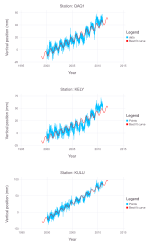

In [106]:
# Plot
y_qaq1 = m2_qaq1[1] + x1.*m2_qaq1[2] + m2_qaq1[3].*sin.(2.*pi.*x1) + m2_qaq1[4].*cos.(2.*pi.*x1)
y_kely = m2_kely[1] + x2.*m2_kely[2] + m2_kely[3].*sin.(2.*pi.*x2) + m2_kely[4].*cos.(2.*pi.*x2)
y_kulu = m2_kulu[1] + x3.*m2_kulu[2] + m2_kulu[3].*sin.(2.*pi.*x3) + m2_kulu[4].*cos.(2.*pi.*x3)

# qaq1
p4 = plot(layer(x = x1 + 2000, y = y_qaq1, Theme(default_color=colorant"red") , Geom.line),
     layer(x = qaq1[:,1] + 2000, y = qaq1[:,2], Geom.line),
     Guide.xlabel("Year"), Guide.ylabel("Vertical position (mm)"),
     Guide.title("Station: QAQ1"),
     Guide.manual_color_key("Legend", ["data", "Best fit curve"], ["deepskyblue", "red"]))

# kely
p5 = plot(layer(x = x2 + 2000, y = y_kely, Theme(default_color=colorant"red") , Geom.line),
     layer(x = kely[:,1] + 2000, y = kely[:,2], Geom.line),
     Guide.xlabel("Year"), Guide.ylabel("Vertical position (mm)"),
     Guide.title("Station: KELY"),
     Guide.manual_color_key("Legend", ["Points", "Best fit curve"], ["deepskyblue", "red"]))

# kulu
p6 = plot(layer(x = x3 + 2000, y = y_kulu, Theme(default_color=colorant"red") , Geom.line),
     layer(x = kulu[:,1] + 2000, y = kulu[:,2], Geom.line),
     Guide.xlabel("Year"), Guide.ylabel("Vertical position (mm)"),
     Guide.title("Station: KULU"),
     Guide.manual_color_key("Legend", ["Points", "Best fit curve"], ["deepskyblue", "red"]))

vstack(p4, p5, p6)

<h3> (d)

In [58]:
# ice mass seasonal model fit
m_ice = SeasonalModelFit(icemass);

* Icemass loss rate = 1.74 mm/yr
* Amplitude of sine = 0.14 mm
* Amplitude of cosine = -0.05 mm

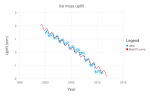

In [107]:
# Plot
x_ice = linspace(minimum(icemass[:,1])-1,maximum(icemass[:,1])+1,100)
y_ice = m_ice[1] + x_ice.*m_ice[2] + m_ice[3].*sin.(2.*pi.*x_ice) + m_ice[4].*cos.(2.*pi.*x_ice)

set_default_plot_size(15cm, 10cm)

plot(layer(x = x_ice + 2000, y = y_ice, Theme(default_color=colorant"red") , Geom.line),
     layer(x = icemass[:,1] + 2000, y = icemass[:,2], Geom.point),
     Guide.xlabel("Year"), Guide.ylabel("Uplift (mm)"),
     Guide.title("Ice mass uplift"),
     Guide.manual_color_key("Legend", ["data", "Best fit curve"], ["deepskyblue", "red"]))

<h3> (e)

In [108]:
# Compute the residuals
res2_qaq1 = qaq1[:,2] - (m2_qaq1[1] + qaq1[:,1].*m2_qaq1[2] + 
            m2_qaq1[3].*sin.(2.*pi.*qaq1[:,1]) + m2_qaq1[4].*cos.(2.*pi.*qaq1[:,1]))

res2_kely = kely[:,2] - (m2_kely[1] + kely[:,1].*m2_kely[2] + 
            m2_kely[3].*sin.(2.*pi.*kely[:,1]) + m2_kely[4].*cos.(2.*pi.*kely[:,1]))

res2_kulu = kulu[:,2] - (m2_kulu[1] + kulu[:,1].*m2_kulu[2] + 
            m2_kulu[3].*sin.(2.*pi.*kulu[:,1]) + m2_kulu[4].*cos.(2.*pi.*kulu[:,1]))

res_ice = icemass[:,2] - (m_ice[1] + icemass[:,1].*m_ice[2] + 
          m_ice[3].*sin.(2.*pi.*icemass[:,1]) + m_ice[4].*cos.(2.*pi.*icemass[:,1]))

# Plot residuals of part c and part d
set_default_plot_size(20cm, 15cm)

plot(layer(x = icemass[:,1] + 2000, y = 50.*res_ice, Theme(default_color=colorant"yellow"), size = [0.1], Geom.point),
     layer(x = kulu[:,1] + 2000, y = 0.*kulu[:,1], Theme(default_color=colorant"black"), Geom.line),
     layer(x = qaq1[:,1] + 2000, y = res2_qaq1, Theme(default_color=colorant"red"), size = [0.1], Geom.point),
     layer(x = kely[:,1] + 2000, y = res2_kely, Theme(default_color=colorant"green"), size = [0.1], Geom.point),
     layer(x = kulu[:,1] + 2000, y = res2_kulu, Theme(default_color=colorant"blue"), size = [0.1], Geom.point),
     Guide.xlabel("Year"), Guide.ylabel("Vertical position (mm)"),
     Guide.title("Residuals"),
     Guide.manual_color_key("Legend", ["Zero line", "QAQ1", "KELY", "KULU", "Ice*50"], 
                                      ["black", "red", "green", "blue", "yellow"]))

<h3> (f)

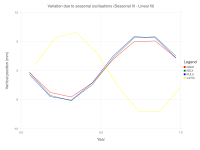

In [115]:
# Variation due to seasonal oscillations only
m_ice1 = LinearUpliftFit(icemass)
var_ice = y_ice - (m_ice1[1].*x_ice + m_ice1[2])
var_kulu = y_kulu - (m_kulu[1].*x3 + m_kulu[2])
var_kely = y_kely - (m_kely[1].*x2 + m_kely[2])
var_qaq1 = y_qaq1 - (m_qaq1[1].*x1 + m_qaq1[2])

# Find array index for 1 year period between 2000 and 2001
idx = find(x -> (0<=x<=1), x2)

plot(layer(x = x_ice[idx], y = 50.*var_ice[idx], Theme(default_color=colorant"yellow"), Geom.line),
     layer(x = x3[idx], y = var_kulu[idx], Theme(default_color=colorant"blue"), Geom.line),
     layer(x = x1[idx], y = var_qaq1[idx], Theme(default_color=colorant"red"), Geom.line),
     layer(x = x2[idx], y = var_kely[idx], Theme(default_color=colorant"green"), Geom.line),
     Guide.xlabel("Year(2000-2001)"), Guide.ylabel("Vertical position (mm)"),
     #Guide.xticks(ticks=[linspace(1,12,13)]),
     Guide.title("Variation due to seasonal oscilaations (Seasonal fit - Linear fit)"),
     Guide.manual_color_key("Legend", ["QAQ1", "KELY", "KULU", "Ice*50"], 
                                      ["red", "green", "blue", "yellow"]))